# RNN on Audio Input
Creating the common methods and classes which will be used and reused across the whole notebook

The data is stored in google drive and am accessing it using mounted drive in colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!nvidia-smi

Sun Oct 17 21:06:19 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    38W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

The following cell block imports all the libraries, functions, methods that are being used inn this jupyter notebook.<br>
The Deep Learning/Machine Learning Libarary being used here is the high level keras API of tensorflow 2.X.<Br>
And the plotting is done with matplotlib plotting package.

Along with this all the constants that will be common throughout the file are defined and declared here.

Using the indisplay feature of the IPYTHON module for audio file to display audios

In [ ]:
# !pip install librosa 
!pip install pydub
import numpy as np
import pandas as pd
import tensorflow as tf
import librosa
import soundfile as sf
import matplotlib.pyplot as plt
from pydub import AudioSegment
from sklearn.preprocessing import normalize
import IPython
%matplotlib inline

DIM = 513
BATCH_SIZE = 32
EPOCHS = 500

IPython.display.Audio("/content/drive/MyDrive/DLS/data/train_dirty_male.wav")

In [ ]:
IPython.display.Audio("/content/drive/MyDrive/DLS/data/train_clean_male.wav")

Above two audios are the clean audio (training features) and clean output (target) audio.

In [ ]:
Y_test_1_sn, sr_test_1=librosa.load('/content/drive/MyDrive/DLS/data/test_x_01.wav', sr=None)
Y_test_1=librosa.stft(Y_test_1_sn, n_fft=1024, hop_length=512)
Y_test_2_sn, sr_test_2=librosa.load("/content/drive/MyDrive/DLS/data/test_x_02.wav", sr=None)
Y_test_2=librosa.stft(Y_test_2_sn, n_fft=1024, hop_length=512)
abs_Y_test_1 = np.abs(Y_test_1.T)
abs_Y_test_2 = np.abs(Y_test_2.T)
IPython.display.Audio('/content/drive/MyDrive/DLS/data/test_x_01.wav')

In [ ]:
IPython.display.Audio('/content/drive/MyDrive/DLS/data/test_x_02.wav')

Above two are the audio files which will be predicted using the trained model

In [ ]:
s, sr=librosa.load('/content/drive/MyDrive/DLS/data/train_clean_male.wav', sr=None)
S=librosa.stft(s, n_fft=1024, hop_length=512)
sn, sr=librosa.load("/content/drive/MyDrive/DLS/data/train_dirty_male.wav", sr=None)
X=librosa.stft(sn, n_fft=1024, hop_length=512)
abs_s = np.abs(S.T)
abs_x = np.abs(X.T)
abs_x.shape

(2459, 513)

Moving on to the 1D Conv layers.
Using leaky relu as the activation function because it doesnt kill the neurons as the relu function does instead it scales the negative outputs to some smaller values.<br>
Model Architecture:-

In [ ]:
question_2_model = tf.keras.Sequential([
                                        tf.keras.layers.Input(shape=(513,)),
                                        tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1)),
                                        tf.keras.layers.Conv1D(32, 2, 1, activation=tf.keras.layers.LeakyReLU()),
                                        tf.keras.layers.MaxPool1D(2),
                                        tf.keras.layers.Conv1D(64, 2, 2, activation=tf.keras.layers.LeakyReLU()),
                                        tf.keras.layers.Conv1D(32, 2, 2, activation=tf.keras.layers.LeakyReLU()),
                                        tf.keras.layers.MaxPool1D(2),
                                        tf.keras.layers.Flatten(),
                                        tf.keras.layers.Dense(513, activation="relu")
])
question_2_model.compile(metrics=[SNR],
              optimizer=tf.keras.optimizers.Adam(),
              loss='mse')
question_2_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_2 (Lambda)            (None, 513, 1)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 512, 32)           96        
_________________________________________________________________
max_pooling1d_2 (MaxPooling1 (None, 256, 32)           0         
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 128, 64)           4160      
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 64, 32)            4128      
_________________________________________________________________
max_pooling1d_3 (MaxPooling1 (None, 32, 32)            0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 1024)             

SNR value of the training set and target

In [ ]:
SNR_numpy(abs_s, question_2_model.predict(abs_x))

14.778270721435547

## Training for 1D conv model

In [ ]:
train_gen = DataGenerator(abs_x, abs_s, BATCH_SIZE, DIM)
question_2_model.fit(train_gen, epochs=EPOCHS, callbacks = [es])

Epoch 1/500
76/76 [==============================] - 1s 3ms/step - loss: 0.0684 - SNR: 1.5715
Epoch 2/500
76/76 [==============================] - 0s 3ms/step - loss: 0.0407 - SNR: 3.7076
Epoch 3/500
76/76 [==============================] - 0s 4ms/step - loss: 0.0258 - SNR: 5.2490
Epoch 4/500
76/76 [==============================] - 0s 4ms/step - loss: 0.0207 - SNR: 6.0499
Epoch 5/500
76/76 [==============================] - 0s 4ms/step - loss: 0.0186 - SNR: 6.4365
Epoch 6/500
76/76 [==============================] - 0s 4ms/step - loss: 0.0167 - SNR: 6.8742
Epoch 7/500
76/76 [==============================] - 0s 3ms/step - loss: 0.0154 - SNR: 7.1643
Epoch 8/500
76/76 [==============================] - 0s 3ms/step - loss: 0.0145 - SNR: 7.3613
Epoch 9/500
76/76 [==============================] - 0s 3ms/step - loss: 0.0139 - SNR: 7.5667
Epoch 10/500
76/76 [==============================] - 0s 3ms/step - loss: 0.0134 - SNR: 7.6865
Epoch 11/500
76/76 [==============================] - 0s 3m

For somereason the following block of code is constantly throwing error when i run the whole file (Run All) but if i just run the question_2_model seperatly it works just fine.

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(question_2_model.history.history["loss"])

KeyError: ignored

<Figure size 864x576 with 0 Axes>

### OUtputs for :
- Training set
- Test Set 1
- Test set 2

In [ ]:
val_data = get_final_voice_vector(X, abs_x, question_2_model)
sf.write('training_set_ques_2.wav', librosa.istft(val_data, hop_length=512), sr)
IPython.display.Audio(librosa.istft(val_data, hop_length=512),rate=sr)

In [ ]:
test1 = get_final_voice_vector(Y_test_1, abs_Y_test_1, question_2_model)
sf.write('test_set_1_ques_2.wav', librosa.istft(test1, hop_length=512), sr_test_1)
IPython.display.Audio(librosa.istft(test1, hop_length=512),rate=sr_test_1)

In [ ]:
test2 = get_final_voice_vector(Y_test_2, abs_Y_test_2, question_2_model)
sf.write('test_set_2_ques_2.wav', librosa.istft(test2, hop_length=512), sr_test_2)
IPython.display.Audio(librosa.istft(test2, hop_length=512),rate=sr_test_2)

# Preprocessing & RNN structure



The following block of code helps in getting a 20x513 dimensional image from the original training set. 
Adding 19 empty 513 dimensional layers in front of the existing data so that the resulting 20x513 dimensional data has same training point as the target and the original set.

In [ ]:
def get_image_audio_vals(abs_val, total_dims):
    modified_data = np.concatenate((np.zeros((19, 513)), abs_val.copy()))

    temp_X = np.empty((total_dims, 20, 513))
    temp_Y = np.empty((total_dims, 513))
    images = 0
    while True:
        if modified_data[images:images+20].shape[0] < 20:
            break
        temp_X[images,] = modified_data[images:images+20]
        temp_Y[images,] = abs_s[images]
        images+=1

    return temp_X, temp_Y

In [ ]:
question_3_model = tf.keras.Sequential([
                                        tf.keras.layers.Input(shape=(20,513,)),
                                        tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1)),
                                        tf.keras.layers.Conv2D(32, 2, activation=tf.keras.layers.LeakyReLU()),
                                        # tf.keras.layers.MaxPool2D(2),
                                        tf.keras.layers.Conv2D(16, 2, activation=tf.keras.layers.LeakyReLU()),
                                        # tf.keras.layers.MaxPool2D(2),
                                        tf.keras.layers.Conv2D(8, 2, activation=tf.keras.layers.LeakyReLU()),
                                        # tf.keras.layers.MaxPool2D(2),
                                        tf.keras.layers.Flatten(),
                                        # tf.keras.layers.Dense(16384, activation = tf.keras.layers.LeakyReLU()),
                                        # tf.keras.layers.Dense(5192, activation = tf.keras.layers.LeakyReLU()),
                                        # tf.keras.layers.Dense(1024, activation = tf.keras.layers.LeakyReLU()),

                                        # tf.keras.layers.Dropout(0.2),
                                        tf.keras.layers.Dense(513, activation = 'relu')
])
question_3_model.compile(metrics = [SNR],
              optimizer=tf.keras.optimizers.Adam(),
              loss='mse')
question_3_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_1 (Lambda)            (None, 20, 513, 1)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 19, 512, 32)       160       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 18, 511, 16)       2064      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 17, 510, 8)        520       
_________________________________________________________________
flatten_1 (Flatten)          (None, 69360)             0         
_________________________________________________________________
dense_7 (Dense)              (None, 513)               35582193  
Total params: 35,584,937
Trainable params: 35,584,937
Non-trainable params: 0
__________________________________________

The architecture as above. But i have exluded the MaxPooling layers because adding it made the output for the testing sets so bad that they were barely recognisable.
## Training

In [ ]:
train_x, train_y = get_image_audio_vals(abs_x, 2459)
es = tf.keras.callbacks.EarlyStopping(monitor='SNR', mode='max', patience=10)
question_3_model.fit(train_x, train_y, batch_size=BATCH_SIZE, epochs = EPOCHS, callbacks=[es])

Epoch 1/500
77/77 [==============================] - 2s 15ms/step - loss: 0.0680 - SNR: 1.6190
Epoch 2/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0359 - SNR: 4.2504
Epoch 3/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0280 - SNR: 5.3373
Epoch 4/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0244 - SNR: 6.0896
Epoch 5/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0219 - SNR: 6.5000
Epoch 6/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0203 - SNR: 6.9560
Epoch 7/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0188 - SNR: 7.2473
Epoch 8/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0182 - SNR: 7.3767
Epoch 9/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0171 - SNR: 7.7483
Epoch 10/500
77/77 [==============================] - 1s 14ms/step - loss: 0.0170 - SNR: 7.8052
Epoch 11/500
77/77 [=============================

Plot of loss change

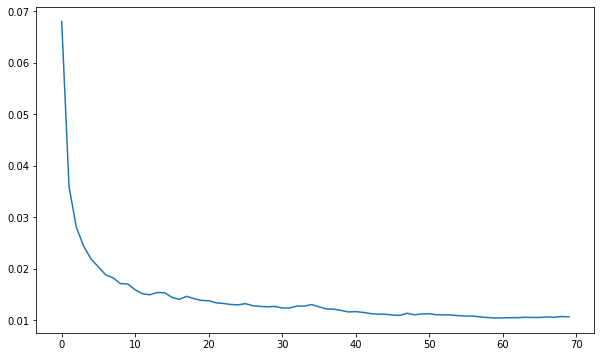

In [ ]:
plt.figure(figsize = (10,6))
plt.plot(question_3_model.history.history["loss"])

In [ ]:
SNR_numpy(abs_s, question_3_model.predict(get_image_audio_vals(abs_x, 2459)[0]))

9.805651903152466

## Outputs for :
- Training set
- Test Set 1
- Test set 2

In [ ]:
val_data = np.multiply((X/abs_x.T) , np.abs(question_3_model.predict(get_image_audio_vals(abs_x, abs_x.shape[0])[0])).T) 
sf.write('training_set_ques_3.wav', librosa.istft(val_data, hop_length=512), sr)
IPython.display.Audio(librosa.istft(val_data, hop_length=512),rate=sr)

In [ ]:
test1_inp = get_image_audio_vals(abs_Y_test_1, abs_Y_test_1.shape[0])[0]
preds_test1 = question_3_model.predict(test1_inp)
test1 = np.multiply((Y_test_1/abs_Y_test_1.T) , np.abs(preds_test1).T)
sf.write('test_set_1_ques_3.wav', librosa.istft(test1, hop_length=512), sr_test_1)
IPython.display.Audio(librosa.istft(test1, hop_length=512),rate=sr_test_1)

In [ ]:
test2_inp = get_image_audio_vals(abs_Y_test_2, abs_Y_test_2.shape[0])[0]
preds_test2 = question_3_model.predict(test2_inp)
test2 = np.multiply((Y_test_2/abs_Y_test_2.T) , np.abs(preds_test2).T) 
sf.write('test_set_2_ques_3.wav', librosa.istft(test2, hop_length=512), sr_test_2)
IPython.display.Audio(librosa.istft(test2, hop_length=512),rate=sr_test_2)